Importación y Carga de Datos

In [1]:
# Importaciones correctas
import pandas as pd
import lightgbm as lgb
import catboost as cb
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import optuna
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split

df = pd.read_csv('Telco Churn dataset 2.csv')

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Preprocesamiento

In [2]:
# 1. Preprocesamiento
# a. Crear la columna 'Churn' y asignar 1 si 'Churn' es 'Yes', de lo contrario 0
df['Churn'] = df['Churn'].apply(lambda x: 1 if x == 'Yes' else 0)

# b. Eliminar columnas con más del 50% de datos faltantes
threshold = int(0.5 * len(df))
df = df.dropna(thresh=threshold, axis=1)

# c. Reemplazar valores atípicos por la media
for col in df.select_dtypes(include=['float64', 'int64']):
    if col != 'Churn':  # Asegurarse de no modificar la columna 'Churn'
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        df[col] = df[col].apply(lambda x: df[col].mean() if (x < (Q1 - 1.5 * IQR)) or (x > (Q3 + 1.5 * IQR)) else x)

# d. Convertir variables categóricas a numéricas y llenar valores faltantes
for column in df.columns:
    if df[column].dtype == 'object' and column != 'Churn':
        df[column].fillna(df[column].mode()[0], inplace=True)
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])
    elif df[column].dtype in ['int64', 'float64']:
        df[column].fillna(df[column].median(), inplace=True)

# e. Normalización
cols_to_scale = df.columns.tolist()
cols_to_scale.remove('Churn')
scaler = StandardScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

# f. Asegurarse de que 'Churn' sea int
df['Churn'] = df['Churn'].astype(int)


Selección de características

In [3]:
# 2. Selección de características
xgb_for_feature_selection = XGBClassifier(
    objective='binary:logistic', 
    random_state=42, 
    use_label_encoder=False, 
    eval_metric='logloss'
)
xgb_for_feature_selection.fit(df.drop('Churn', axis=1), df['Churn'])
threshold = 0.01  
selected_features = df.drop('Churn', axis=1).columns[(xgb_for_feature_selection.feature_importances_ > threshold)].tolist()
print("Características seleccionadas:", selected_features)

Características seleccionadas: ['customerID', 'SeniorCitizen', 'tenure', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'InternationalPlan', 'VoiceMailPlan', 'NumbervMailMessages', 'TotalDayMinutes', 'TotalEveMinutes', 'TotalNightMinutes', 'TotalIntlMinutes', 'TotalIntlCalls', 'CustomerServiceCalls']


Balanceo con SMOTE

In [4]:
# 3. Balanceo con SMOTE
X = df[selected_features]
y = df['Churn']
smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)

División de Conjunto

In [5]:
# 4. División de Conjunto
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=42)

Define los hiperparámetros iniciales

In [6]:
# Define los hiperparámetros iniciales
initial_params = {
    'xgb': {
        'subsample': 0.9,
        'scale_pos_weight': 1,
        'reg_lambda': 50.0,
        'n_estimators': 300,
        'max_depth': 8,
        'learning_rate': 0.3,
        'gamma': 0,
        'colsample_bytree': 0.9,
    },
    'lgb': {
        'n_estimators': 200,
        'learning_rate': 0.2,
        'max_depth': -1,
        'num_leaves': 20,
    },
    'cb': {
        'iterations': 200,
        'learning_rate': 0.1,
        'depth': 9,
    }
}

Inicializar modelos con los hiperparámetros óptimos encontrados

In [7]:
# Función objetivo para la optimización con Optuna
def objective(trial):
    # 5. Inicialización de modelos con hiperparámetros sugeridos
    if trial.number == 0:
        xgb_params = initial_params['xgb']
        lgb_params = initial_params['lgb']
        cb_params = initial_params['cb']
    else:
        xgb_params = {
        'subsample': trial.suggest_float('xgb__subsample', 0.1, 1),
        'scale_pos_weight': trial.suggest_float('xgb__scale_pos_weight', 1, 10),
        'reg_lambda': trial.suggest_float('xgb__reg_lambda', 0.1, 10),
        'n_estimators': trial.suggest_int('xgb__n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('xgb__max_depth', 1, 10),
        'learning_rate': trial.suggest_float('xgb__learning_rate', 0.001, 1, log=True),
        'gamma': trial.suggest_float('xgb__gamma', 0, 1),
        'colsample_bytree': trial.suggest_float('xgb__colsample_bytree', 0.1, 1),
        'random_state': 42,
        'use_label_encoder': False,
        'eval_metric': 'logloss'
    }
    lgb_params = {
        'objective': 'binary',
        'boosting_type': 'gbdt',
        'n_estimators': trial.suggest_int('lgb__n_estimators', 100, 1000),
        'learning_rate': trial.suggest_float('lgb__learning_rate', 0.01, 1, log=True),
        'max_depth': trial.suggest_int('lgb__max_depth', -1, 10),
        'num_leaves': trial.suggest_int('lgb__num_leaves', 2, 100, step=2),
        'random_state': 42
    }
    cb_params = {
        'iterations': trial.suggest_int('cb__iterations', 100, 1000),
        'learning_rate': trial.suggest_float('cb__learning_rate', 0.01, 1, log=True),
        'depth': trial.suggest_int('cb__depth', 1, 10),
        'eval_metric': 'AUC',
        'random_seed': 42,
        'verbose': 200
    }

    xgb_model = XGBClassifier(**xgb_params)
    lgb_model = lgb.LGBMClassifier(**lgb_params)
    cb_model = cb.CatBoostClassifier(**cb_params)

    #Crear un Voting Classifier con soft voting
    voting_clf = VotingClassifier(
    estimators=[('xgb', xgb_model), ('lgb', lgb_model), ('cb', cb_model)],
    voting='soft'
    )
    #Entrenamiento y validación cruzada
    score = cross_val_score(voting_clf, X_train, y_train, cv=5, scoring='accuracy').mean()
    return score    

Crear el estudio de Optuna

In [8]:
# 6. Crear el estudio de Optuna
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
study.optimize(objective, n_trials=100, timeout=None)

[I 2023-11-05 22:46:39,218] A new study created in memory with name: no-name-9913e796-dce1-4418-8c21-15a44d83273f


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2023-11-05 22:46:47,005] Trial 0 finished with value: 0.968421052631579 and parameters: {'lgb__n_estimators': 437, 'lgb__learning_rate': 0.7969454818643931, 'lgb__max_depth': 7, 'lgb__num_leaves': 60, 'cb__iterations': 240, 'cb__learning_rate': 0.020511104188433976, 'cb__depth': 1}. Best is trial 0 with value: 0.968421052631579.


239:	total: 162ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:46:53,538] Trial 1 finished with value: 0.9611842105263158 and parameters: {'xgb__subsample': 0.8795585311974417, 'xgb__scale_pos_weight': 6.41003510568888, 'xgb__reg_lambda': 7.10991852018085, 'xgb__n_estimators': 118, 'xgb__max_depth': 10, 'xgb__learning_rate': 0.31428808908401085, 'xgb__gamma': 0.21233911067827616, 'xgb__colsample_bytree': 0.26364247048639056, 'lgb__n_estimators': 265, 'lgb__learning_rate': 0.04059611610484305, 'lgb__max_depth': 5, 'lgb__num_leaves': 44, 'cb__iterations': 362, 'cb__learning_rate': 0.1673808578875213, 'cb__depth': 2}. Best is trial 0 with value: 0.968421052631579.


200:	total: 210ms	remaining: 168ms
361:	total: 366ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
0:	total: 1.25ms	remaining: 1.21s
200:	total: 260ms	remaining: 994ms
400:	total: 488ms	remaining: 693ms
600:	total: 712ms	remaining: 437ms
800:	total: 933ms	remaining: 197ms
969:	total: 1.12s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choos

[I 2023-11-05 22:47:38,662] Trial 2 finished with value: 0.968421052631579 and parameters: {'xgb__subsample': 0.3629301836816964, 'xgb__scale_pos_weight': 4.297256589643226, 'xgb__reg_lambda': 4.615092843748656, 'xgb__n_estimators': 807, 'xgb__max_depth': 2, 'xgb__learning_rate': 0.034890188454913866, 'xgb__gamma': 0.5924145688620425, 'xgb__colsample_bytree': 0.14180537144799796, 'lgb__n_estimators': 647, 'lgb__learning_rate': 0.021930485556643693, 'lgb__max_depth': -1, 'lgb__num_leaves': 96, 'cb__iterations': 970, 'cb__learning_rate': 0.4138040112561014, 'cb__depth': 4}. Best is trial 0 with value: 0.968421052631579.


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2023-11-05 22:47:54,166] Trial 3 finished with value: 0.9644736842105264 and parameters: {'xgb__subsample': 0.1879049026057455, 'xgb__scale_pos_weight': 7.158097238609412, 'xgb__reg_lambda': 4.457509688022053, 'xgb__n_estimators': 209, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.00126813521690846, 'xgb__gamma': 0.9093204020787821, 'xgb__colsample_bytree': 0.3329019834400152, 'lgb__n_estimators': 696, 'lgb__learning_rate': 0.0420167205437253, 'lgb__max_depth': 5, 'lgb__num_leaves': 56, 'cb__iterations': 266, 'cb__learning_rate': 0.8692991511139546, 'cb__depth': 8}. Best is trial 0 with value: 0.968421052631579.


265:	total: 1.06s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
0:	total: 873us	remaining: 308ms
200:	total: 173ms	remaining: 131ms
352:	total: 306ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] 

[I 2023-11-05 22:48:08,218] Trial 4 finished with value: 0.9618421052631578 and parameters: {'xgb__subsample': 0.9455490474077702, 'xgb__scale_pos_weight': 9.053446153848839, 'xgb__reg_lambda': 6.019209790229743, 'xgb__n_estimators': 930, 'xgb__max_depth': 1, 'xgb__learning_rate': 0.0038721180321745824, 'xgb__gamma': 0.045227288910538066, 'xgb__colsample_bytree': 0.39279729768693794, 'lgb__n_estimators': 450, 'lgb__learning_rate': 0.03488976654890366, 'lgb__max_depth': 8, 'lgb__num_leaves': 36, 'cb__iterations': 353, 'cb__learning_rate': 0.1217284708112243, 'cb__depth': 2}. Best is trial 0 with value: 0.968421052631579.


200:	total: 257ms	remaining: 194ms
352:	total: 403ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:48:19,385] Trial 5 finished with value: 0.9703947368421053 and parameters: {'xgb__subsample': 0.8219772826786357, 'xgb__scale_pos_weight': 1.6709557931179373, 'xgb__reg_lambda': 9.870180672345121, 'xgb__n_estimators': 795, 'xgb__max_depth': 2, 'xgb__learning_rate': 0.001038882310402793, 'xgb__gamma': 0.8154614284548342, 'xgb__colsample_bytree': 0.7361716094628554, 'lgb__n_estimators': 756, 'lgb__learning_rate': 0.34877126245459306, 'lgb__max_depth': -1, 'lgb__num_leaves': 36, 'cb__iterations': 204, 'cb__learning_rate': 0.53236175947515, 'cb__depth': 7}. Best is trial 5 with value: 0.9703947368421053.


200:	total: 512ms	remaining: 7.65ms
203:	total: 520ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-11-05 22:48:34,469] Trial 6 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.39780822236738433, 'xgb__scale_pos_weight': 1.5720251525742128, 'xgb__reg_lambda': 3.178724984985056, 'xgb__n_estimators': 392, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.08178476574339538, 'xgb__gamma': 0.8872127425763265, 'xgb__colsample_bytree': 0.5249934326457544, 'lgb__n_estimators': 207, 'lgb__learning_rate': 0.26698666742744587, 'lgb__max_depth': 8, 'lgb__num_leaves': 58, 'cb__iterations': 794, 'cb__learning_rate': 0.09718319944817398, 'cb__depth': 6}. Best is trial 6 with value: 0.9710526315789474.


793:	total: 1.67s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
0:	total: 901us	remaining: 151ms
168:	total: 151ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3472
[LightGBM] [Info] N

[I 2023-11-05 22:48:42,437] Trial 7 finished with value: 0.9625 and parameters: {'xgb__subsample': 0.4847869165226947, 'xgb__scale_pos_weight': 1.2287721406968566, 'xgb__reg_lambda': 1.168125127233714, 'xgb__n_estimators': 128, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.00877138034328056, 'xgb__gamma': 0.5085706911647028, 'xgb__colsample_bytree': 0.9168098265334838, 'lgb__n_estimators': 324, 'lgb__learning_rate': 0.06618595597183478, 'lgb__max_depth': 8, 'lgb__num_leaves': 24, 'cb__iterations': 169, 'cb__learning_rate': 0.037975447986784164, 'cb__depth': 2}. Best is trial 6 with value: 0.9710526315789474.


168:	total: 146ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:49:08,908] Trial 8 finished with value: 0.9662280701754385 and parameters: {'xgb__subsample': 0.9367278871083158, 'xgb__scale_pos_weight': 8.273083416079754, 'xgb__reg_lambda': 6.3706971894531925, 'xgb__n_estimators': 885, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.003628358380354917, 'xgb__gamma': 0.8925589984899778, 'xgb__colsample_bytree': 0.5854080177240857, 'lgb__n_estimators': 827, 'lgb__learning_rate': 0.6197015748809142, 'lgb__max_depth': 2, 'lgb__num_leaves': 12, 'cb__iterations': 305, 'cb__learning_rate': 0.07148510793512983, 'cb__depth': 9}. Best is trial 6 with value: 0.9710526315789474.


304:	total: 2.34s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:49:23,811] Trial 9 finished with value: 0.9682017543859649 and parameters: {'xgb__subsample': 0.8746575249307091, 'xgb__scale_pos_weight': 1.0625691747807164, 'xgb__reg_lambda': 5.1563982955179, 'xgb__n_estimators': 476, 'xgb__max_depth': 3, 'xgb__learning_rate': 0.0022887381144600966, 'xgb__gamma': 0.33761517140362796, 'xgb__colsample_bytree': 0.9486187335212672, 'lgb__n_estimators': 391, 'lgb__learning_rate': 0.10903884523201109, 'lgb__max_depth': 7, 'lgb__num_leaves': 38, 'cb__iterations': 975, 'cb__learning_rate': 0.8411909465645718, 'cb__depth': 3}. Best is trial 6 with value: 0.9710526315789474.


974:	total: 907ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
0:	total: 31.2ms	remaining: 21.7s
200:	total: 431ms	remaining: 1.06s
400:	total: 843ms	remaining: 618ms
600:	total: 1.23s	remaining: 192ms
694:	total: 1.41s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memo

[I 2023-11-05 22:49:39,851] Trial 10 finished with value: 0.9574561403508772 and parameters: {'xgb__subsample': 0.13281282292443136, 'xgb__scale_pos_weight': 3.742443453759629, 'xgb__reg_lambda': 0.17471846123130153, 'xgb__n_estimators': 454, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.15892652402201882, 'xgb__gamma': 0.7303668952070097, 'xgb__colsample_bytree': 0.5628978199858851, 'lgb__n_estimators': 131, 'lgb__learning_rate': 0.010583330024545163, 'lgb__max_depth': 10, 'lgb__num_leaves': 78, 'cb__iterations': 695, 'cb__learning_rate': 0.01858311497609687, 'cb__depth': 6}. Best is trial 6 with value: 0.9710526315789474.


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2023-11-05 22:49:57,233] Trial 11 finished with value: 0.9721491228070175 and parameters: {'xgb__subsample': 0.6698106053816376, 'xgb__scale_pos_weight': 2.773455636257492, 'xgb__reg_lambda': 9.439747004876814, 'xgb__n_estimators': 670, 'xgb__max_depth': 4, 'xgb__learning_rate': 0.03971357763524548, 'xgb__gamma': 0.9986141484469649, 'xgb__colsample_bytree': 0.7090690593585249, 'lgb__n_estimators': 896, 'lgb__learning_rate': 0.25253710106474536, 'lgb__max_depth': -1, 'lgb__num_leaves': 70, 'cb__iterations': 666, 'cb__learning_rate': 0.2468475257066117, 'cb__depth': 6}. Best is trial 11 with value: 0.9721491228070175.


600:	total: 1.14s	remaining: 124ms
665:	total: 1.26s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:50:09,367] Trial 12 finished with value: 0.9677631578947368 and parameters: {'xgb__subsample': 0.607933011414757, 'xgb__scale_pos_weight': 2.8917193482600827, 'xgb__reg_lambda': 9.192025369894699, 'xgb__n_estimators': 625, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.06947313985590953, 'xgb__gamma': 0.9872751163808758, 'xgb__colsample_bytree': 0.6896146022387206, 'lgb__n_estimators': 992, 'lgb__learning_rate': 0.1955608646920978, 'lgb__max_depth': 2, 'lgb__num_leaves': 72, 'cb__iterations': 724, 'cb__learning_rate': 0.2227637493751886, 'cb__depth': 5}. Best is trial 11 with value: 0.9721491228070175.


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2023-11-05 22:50:52,515] Trial 13 finished with value: 0.9657894736842104 and parameters: {'xgb__subsample': 0.6494426130134728, 'xgb__scale_pos_weight': 2.7389721299067293, 'xgb__reg_lambda': 2.9503020647041343, 'xgb__n_estimators': 340, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.8872754604813388, 'xgb__gamma': 0.98237896790926, 'xgb__colsample_bytree': 0.4574951756020474, 'lgb__n_estimators': 980, 'lgb__learning_rate': 0.21974606323159201, 'lgb__max_depth': 2, 'lgb__num_leaves': 84, 'cb__iterations': 718, 'cb__learning_rate': 0.09029245888295048, 'cb__depth': 10}. Best is trial 11 with value: 0.9721491228070175.


717:	total: 7.44s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:51:04,701] Trial 14 finished with value: 0.969078947368421 and parameters: {'xgb__subsample': 0.434566383634855, 'xgb__scale_pos_weight': 4.836414111415214, 'xgb__reg_lambda': 8.060367468962472, 'xgb__n_estimators': 640, 'xgb__max_depth': 4, 'xgb__learning_rate': 0.019559432443921738, 'xgb__gamma': 0.7019653021707359, 'xgb__colsample_bytree': 0.7207069826905906, 'lgb__n_estimators': 136, 'lgb__learning_rate': 0.38762234067762213, 'lgb__max_depth': 10, 'lgb__num_leaves': 64, 'cb__iterations': 570, 'cb__learning_rate': 0.21656331922769725, 'cb__depth': 6}. Best is trial 11 with value: 0.9721491228070175.


569:	total: 1.08s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:51:19,084] Trial 15 finished with value: 0.9701754385964912 and parameters: {'xgb__subsample': 0.6615445215379132, 'xgb__scale_pos_weight': 2.6316167625250446, 'xgb__reg_lambda': 8.285986378561791, 'xgb__n_estimators': 334, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.050823199741521385, 'xgb__gamma': 0.797497850446368, 'xgb__colsample_bytree': 0.4861251112150538, 'lgb__n_estimators': 573, 'lgb__learning_rate': 0.13883730996933275, 'lgb__max_depth': 4, 'lgb__num_leaves': 100, 'cb__iterations': 850, 'cb__learning_rate': 0.06485601459279638, 'cb__depth': 5}. Best is trial 11 with value: 0.9721491228070175.


800:	total: 1.23s	remaining: 75.1ms
849:	total: 1.3s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:51:38,216] Trial 16 finished with value: 0.9653508771929825 and parameters: {'xgb__subsample': 0.32125526881297367, 'xgb__scale_pos_weight': 5.6603564889882225, 'xgb__reg_lambda': 3.0589659242882137, 'xgb__n_estimators': 685, 'xgb__max_depth': 6, 'xgb__learning_rate': 0.016865655037207446, 'xgb__gamma': 0.627759515991911, 'xgb__colsample_bytree': 0.8272321118169882, 'lgb__n_estimators': 863, 'lgb__learning_rate': 0.35518658805520764, 'lgb__max_depth': 0, 'lgb__num_leaves': 88, 'cb__iterations': 510, 'cb__learning_rate': 0.011081717827485531, 'cb__depth': 7}. Best is trial 11 with value: 0.9721491228070175.


509:	total: 1.42s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:51:48,830] Trial 17 finished with value: 0.968421052631579 and parameters: {'xgb__subsample': 0.756652078371093, 'xgb__scale_pos_weight': 3.6346337363263226, 'xgb__reg_lambda': 7.635863377761217, 'xgb__n_estimators': 502, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.09703673774251449, 'xgb__gamma': 0.8459076925241901, 'xgb__colsample_bytree': 0.6226845150688989, 'lgb__n_estimators': 568, 'lgb__learning_rate': 0.21656844610773532, 'lgb__max_depth': 4, 'lgb__num_leaves': 70, 'cb__iterations': 553, 'cb__learning_rate': 0.31201480297685263, 'cb__depth': 4}. Best is trial 11 with value: 0.9721491228070175.


400:	total: 495ms	remaining: 187ms
552:	total: 668ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:52:10,393] Trial 18 finished with value: 0.969078947368421 and parameters: {'xgb__subsample': 0.540069496044894, 'xgb__scale_pos_weight': 2.09412415708047, 'xgb__reg_lambda': 9.974207434914867, 'xgb__n_estimators': 351, 'xgb__max_depth': 6, 'xgb__learning_rate': 0.028496084350624503, 'xgb__gamma': 0.9891464239135087, 'xgb__colsample_bytree': 0.8144954390440066, 'lgb__n_estimators': 270, 'lgb__learning_rate': 0.931922609844827, 'lgb__max_depth': 6, 'lgb__num_leaves': 50, 'cb__iterations': 834, 'cb__learning_rate': 0.1494647693277473, 'cb__depth': 8}. Best is trial 11 with value: 0.9721491228070175.


800:	total: 3.16s	remaining: 130ms
833:	total: 3.28s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
0:	total: 3.06ms	remaining: 1.43s
200:	total: 565ms	remaining: 757ms
400:	total: 1.1s	remaining: 190ms
469:	total: 1.28s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memor

[I 2023-11-05 22:52:21,288] Trial 19 finished with value: 0.9635964912280702 and parameters: {'xgb__subsample': 0.7133609502283069, 'xgb__scale_pos_weight': 2.036072636422574, 'xgb__reg_lambda': 8.863219535590847, 'xgb__n_estimators': 711, 'xgb__max_depth': 4, 'xgb__learning_rate': 0.1043527793063354, 'xgb__gamma': 0.7661016752501415, 'xgb__colsample_bytree': 0.5057966996056662, 'lgb__n_estimators': 894, 'lgb__learning_rate': 0.07902672283861768, 'lgb__max_depth': 1, 'lgb__num_leaves': 4, 'cb__iterations': 470, 'cb__learning_rate': 0.10828591991289961, 'cb__depth': 7}. Best is trial 11 with value: 0.9721491228070175.


400:	total: 1.12s	remaining: 193ms
469:	total: 1.3s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[I 2023-11-05 22:52:37,971] Trial 20 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.5634584219285741, 'xgb__scale_pos_weight': 3.3459158219763174, 'xgb__reg_lambda': 6.8066168791210835, 'xgb__n_estimators': 556, 'xgb__max_depth': 4, 'xgb__learning_rate': 0.010480231499663808, 'xgb__gamma': 0.882855456844308, 'xgb__colsample_bytree': 0.6270621035377406, 'lgb__n_estimators': 505, 'lgb__learning_rate': 0.14628889212817986, 'lgb__max_depth': 9, 'lgb__num_leaves': 50, 'cb__iterations': 849, 'cb__learning_rate': 0.05324086776404978, 'cb__depth': 4}. Best is trial 11 with value: 0.9721491228070175.


800:	total: 1.03s	remaining: 61.9ms
848:	total: 1.09s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-11-05 22:52:55,092] Trial 21 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.559582612061266, 'xgb__scale_pos_weight': 3.4982806659457317, 'xgb__reg_lambda': 7.035214294939058, 'xgb__n_estimators': 550, 'xgb__max_depth': 4, 'xgb__learning_rate': 0.009319217645108258, 'xgb__gamma': 0.887952847753929, 'xgb__colsample_bytree': 0.6238776361168741, 'lgb__n_estimators': 495, 'lgb__learning_rate': 0.1603173631501529, 'lgb__max_depth': 9, 'lgb__num_leaves': 50, 'cb__iterations': 837, 'cb__learning_rate': 0.055576385277589097, 'cb__depth': 4}. Best is trial 11 with value: 0.9721491228070175.


800:	total: 1.07s	remaining: 48.1ms
836:	total: 1.12s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-11-05 22:53:11,895] Trial 22 finished with value: 0.9706140350877194 and parameters: {'xgb__subsample': 0.49962525213987496, 'xgb__scale_pos_weight': 2.151773686324944, 'xgb__reg_lambda': 8.669891491064842, 'xgb__n_estimators': 571, 'xgb__max_depth': 3, 'xgb__learning_rate': 0.04311903676596629, 'xgb__gamma': 0.8863264207654236, 'xgb__colsample_bytree': 0.6578395393032236, 'lgb__n_estimators': 241, 'lgb__learning_rate': 0.11306303777098166, 'lgb__max_depth': 9, 'lgb__num_leaves': 66, 'cb__iterations': 637, 'cb__learning_rate': 0.048541440160401725, 'cb__depth': 5}. Best is trial 11 with value: 0.9721491228070175.


600:	total: 918ms	remaining: 55ms
636:	total: 973ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[I 2023-11-05 22:53:29,530] Trial 23 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.6017681099570997, 'xgb__scale_pos_weight': 1.0055544497339783, 'xgb__reg_lambda': 7.312295459621655, 'xgb__n_estimators': 391, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.014215907169995781, 'xgb__gamma': 0.7036658590785342, 'xgb__colsample_bytree': 0.5419474354073859, 'lgb__n_estimators': 625, 'lgb__learning_rate': 0.2629765505520482, 'lgb__max_depth': 7, 'lgb__num_leaves': 54, 'cb__iterations': 782, 'cb__learning_rate': 0.09223130195543368, 'cb__depth': 6}. Best is trial 11 with value: 0.9721491228070175.


781:	total: 1.64s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:53:45,978] Trial 24 finished with value: 0.9692982456140351 and parameters: {'xgb__subsample': 0.7277431911577497, 'xgb__scale_pos_weight': 3.2122618262010936, 'xgb__reg_lambda': 6.075881995351798, 'xgb__n_estimators': 264, 'xgb__max_depth': 3, 'xgb__learning_rate': 0.02922202485435858, 'xgb__gamma': 0.7904350864827371, 'xgb__colsample_bytree': 0.7742179241612441, 'lgb__n_estimators': 353, 'lgb__learning_rate': 0.14627536029552568, 'lgb__max_depth': 9, 'lgb__num_leaves': 78, 'cb__iterations': 913, 'cb__learning_rate': 0.15769199388801353, 'cb__depth': 3}. Best is trial 11 with value: 0.9721491228070175.


800:	total: 843ms	remaining: 118ms
912:	total: 955ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:54:07,762] Trial 25 finished with value: 0.969078947368421 and parameters: {'xgb__subsample': 0.41922746347025175, 'xgb__scale_pos_weight': 4.5244404118825905, 'xgb__reg_lambda': 7.943439372920438, 'xgb__n_estimators': 762, 'xgb__max_depth': 6, 'xgb__learning_rate': 0.05338492472800643, 'xgb__gamma': 0.936984934243193, 'xgb__colsample_bytree': 0.6603546333319109, 'lgb__n_estimators': 767, 'lgb__learning_rate': 0.4863120750286104, 'lgb__max_depth': 3, 'lgb__num_leaves': 30, 'cb__iterations': 635, 'cb__learning_rate': 0.03570913572400398, 'cb__depth': 8}. Best is trial 11 with value: 0.9721491228070175.


600:	total: 2.43s	remaining: 138ms
634:	total: 2.57s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:54:23,664] Trial 26 finished with value: 0.9721491228070176 and parameters: {'xgb__subsample': 0.5695942433170118, 'xgb__scale_pos_weight': 2.5005404714901087, 'xgb__reg_lambda': 9.205780201885359, 'xgb__n_estimators': 590, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.00717056128953494, 'xgb__gamma': 0.9933267796768782, 'xgb__colsample_bytree': 0.5610712891989997, 'lgb__n_estimators': 189, 'lgb__learning_rate': 0.2810654903954643, 'lgb__max_depth': 8, 'lgb__num_leaves': 62, 'cb__iterations': 781, 'cb__learning_rate': 0.0797537948318683, 'cb__depth': 4}. Best is trial 26 with value: 0.9721491228070176.


780:	total: 988ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:54:38,334] Trial 27 finished with value: 0.9697368421052632 and parameters: {'xgb__subsample': 0.31713272210668775, 'xgb__scale_pos_weight': 2.390148984512592, 'xgb__reg_lambda': 9.125540450903058, 'xgb__n_estimators': 404, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.020878781962699166, 'xgb__gamma': 0.991588831105238, 'xgb__colsample_bytree': 0.45334138098571486, 'lgb__n_estimators': 192, 'lgb__learning_rate': 0.29669763027798307, 'lgb__max_depth': 6, 'lgb__num_leaves': 76, 'cb__iterations': 772, 'cb__learning_rate': 0.24660720283540546, 'cb__depth': 6}. Best is trial 26 with value: 0.9721491228070176.


771:	total: 1.52s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:54:54,457] Trial 28 finished with value: 0.968859649122807 and parameters: {'xgb__subsample': 0.6561944369406078, 'xgb__scale_pos_weight': 2.690764871174976, 'xgb__reg_lambda': 9.974715519022618, 'xgb__n_estimators': 638, 'xgb__max_depth': 10, 'xgb__learning_rate': 0.006315051710504115, 'xgb__gamma': 0.8304007217019832, 'xgb__colsample_bytree': 0.5575981725737077, 'lgb__n_estimators': 195, 'lgb__learning_rate': 0.4967007110560776, 'lgb__max_depth': 6, 'lgb__num_leaves': 86, 'cb__iterations': 638, 'cb__learning_rate': 0.11891821615986937, 'cb__depth': 5}. Best is trial 26 with value: 0.9721491228070176.


600:	total: 982ms	remaining: 60.5ms
637:	total: 1.04s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-11-05 22:55:07,007] Trial 29 finished with value: 0.9662280701754387 and parameters: {'xgb__subsample': 0.4827768974898394, 'xgb__scale_pos_weight': 1.6705959676533821, 'xgb__reg_lambda': 8.730717268931047, 'xgb__n_estimators': 726, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.025867600077517077, 'xgb__gamma': 0.9176180290083353, 'xgb__colsample_bytree': 0.518311658945364, 'lgb__n_estimators': 405, 'lgb__learning_rate': 0.5926985362817919, 'lgb__max_depth': 8, 'lgb__num_leaves': 58, 'cb__iterations': 894, 'cb__learning_rate': 0.0840292200988996, 'cb__depth': 1}. Best is trial 26 with value: 0.9721491228070176.


893:	total: 631ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:55:15,781] Trial 30 finished with value: 0.9682017543859649 and parameters: {'xgb__subsample': 0.7905873358392821, 'xgb__scale_pos_weight': 1.7050971139394244, 'xgb__reg_lambda': 7.6850624601150965, 'xgb__n_estimators': 995, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.22095185940842457, 'xgb__gamma': 0.9921063332987359, 'xgb__colsample_bytree': 0.3771924672473924, 'lgb__n_estimators': 100, 'lgb__learning_rate': 0.7234699441867525, 'lgb__max_depth': 0, 'lgb__num_leaves': 62, 'cb__iterations': 770, 'cb__learning_rate': 0.16053029212495523, 'cb__depth': 3}. Best is trial 26 with value: 0.9721491228070176.


600:	total: 635ms	remaining: 178ms
769:	total: 802ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:55:34,576] Trial 31 finished with value: 0.9714912280701755 and parameters: {'xgb__subsample': 0.5478573994250171, 'xgb__scale_pos_weight': 3.070583861051986, 'xgb__reg_lambda': 6.941236292104267, 'xgb__n_estimators': 557, 'xgb__max_depth': 10, 'xgb__learning_rate': 0.013035821235648233, 'xgb__gamma': 0.870060001855695, 'xgb__colsample_bytree': 0.6043075938492015, 'lgb__n_estimators': 497, 'lgb__learning_rate': 0.23942915203920906, 'lgb__max_depth': 10, 'lgb__num_leaves': 44, 'cb__iterations': 903, 'cb__learning_rate': 0.0700806487651296, 'cb__depth': 4}. Best is trial 26 with value: 0.9721491228070176.


800:	total: 1.05s	remaining: 134ms
902:	total: 1.18s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:55:51,993] Trial 32 finished with value: 0.9692982456140351 and parameters: {'xgb__subsample': 0.6097672664914404, 'xgb__scale_pos_weight': 4.062287323562131, 'xgb__reg_lambda': 8.315768771250944, 'xgb__n_estimators': 516, 'xgb__max_depth': 10, 'xgb__learning_rate': 0.013962733622675553, 'xgb__gamma': 0.9383346203872355, 'xgb__colsample_bytree': 0.5991450843086569, 'lgb__n_estimators': 314, 'lgb__learning_rate': 0.2738294376313204, 'lgb__max_depth': 10, 'lgb__num_leaves': 44, 'cb__iterations': 931, 'cb__learning_rate': 0.07404136433402816, 'cb__depth': 4}. Best is trial 26 with value: 0.9721491228070176.


800:	total: 1.01s	remaining: 164ms
930:	total: 1.17s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:56:11,122] Trial 33 finished with value: 0.9717105263157896 and parameters: {'xgb__subsample': 0.7019560371746218, 'xgb__scale_pos_weight': 2.960937885705155, 'xgb__reg_lambda': 9.197915497341627, 'xgb__n_estimators': 590, 'xgb__max_depth': 10, 'xgb__learning_rate': 0.04405808651828603, 'xgb__gamma': 0.8249361978028182, 'xgb__colsample_bytree': 0.697682925846425, 'lgb__n_estimators': 195, 'lgb__learning_rate': 0.20468855452541102, 'lgb__max_depth': 8, 'lgb__num_leaves': 70, 'cb__iterations': 991, 'cb__learning_rate': 0.121355385665562, 'cb__depth': 5}. Best is trial 26 with value: 0.9721491228070176.


990:	total: 1.6s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[I 2023-11-05 22:56:28,412] Trial 34 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.6857574066598355, 'xgb__scale_pos_weight': 3.1212391782178615, 'xgb__reg_lambda': 9.300287262790967, 'xgb__n_estimators': 602, 'xgb__max_depth': 10, 'xgb__learning_rate': 0.03396152693551819, 'xgb__gamma': 0.836069884731747, 'xgb__colsample_bytree': 0.7007748444174118, 'lgb__n_estimators': 281, 'lgb__learning_rate': 0.19512547834414204, 'lgb__max_depth': 7, 'lgb__num_leaves': 68, 'cb__iterations': 981, 'cb__learning_rate': 0.13560303911845237, 'cb__depth': 3}. Best is trial 26 with value: 0.9721491228070176.


980:	total: 1.08s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:56:48,805] Trial 35 finished with value: 0.9714912280701755 and parameters: {'xgb__subsample': 0.7286487564742062, 'xgb__scale_pos_weight': 4.009103579814301, 'xgb__reg_lambda': 9.33172017775677, 'xgb__n_estimators': 665, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.005797266936328323, 'xgb__gamma': 0.6375943122592694, 'xgb__colsample_bytree': 0.7648530906992973, 'lgb__n_estimators': 650, 'lgb__learning_rate': 0.4577994118240456, 'lgb__max_depth': 5, 'lgb__num_leaves': 44, 'cb__iterations': 920, 'cb__learning_rate': 0.17745523258002677, 'cb__depth': 5}. Best is trial 26 with value: 0.9721491228070176.


800:	total: 1.19s	remaining: 178ms
919:	total: 1.36s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2023-11-05 22:57:05,689] Trial 36 finished with value: 0.9695175438596492 and parameters: {'xgb__subsample': 0.7875437671745087, 'xgb__scale_pos_weight': 4.8713008959814985, 'xgb__reg_lambda': 8.219157703540873, 'xgb__n_estimators': 820, 'xgb__max_depth': 10, 'xgb__learning_rate': 0.04334500165562402, 'xgb__gamma': 0.7553253687139699, 'xgb__colsample_bytree': 0.2009781322648148, 'lgb__n_estimators': 444, 'lgb__learning_rate': 0.36689939899656643, 'lgb__max_depth': 10, 'lgb__num_leaves': 74, 'cb__iterations': 991, 'cb__learning_rate': 0.11587209074847661, 'cb__depth': 4}. Best is trial 26 with value: 0.9721491228070176.


990:	total: 1.26s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:57:25,033] Trial 37 finished with value: 0.9717105263157896 and parameters: {'xgb__subsample': 0.8407670843232602, 'xgb__scale_pos_weight': 3.0980284042223953, 'xgb__reg_lambda': 7.51884129477691, 'xgb__n_estimators': 585, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.02164601240571182, 'xgb__gamma': 0.9352746910555851, 'xgb__colsample_bytree': 0.6929803344543444, 'lgb__n_estimators': 519, 'lgb__learning_rate': 0.17656738426919347, 'lgb__max_depth': 9, 'lgb__num_leaves': 82, 'cb__iterations': 688, 'cb__learning_rate': 0.31831647131047386, 'cb__depth': 3}. Best is trial 26 with value: 0.9721491228070176.


600:	total: 620ms	remaining: 89.8ms
687:	total: 703ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-11-05 22:57:44,663] Trial 38 finished with value: 0.9668859649122806 and parameters: {'xgb__subsample': 0.8745500273349053, 'xgb__scale_pos_weight': 4.29253332109919, 'xgb__reg_lambda': 9.529686266602042, 'xgb__n_estimators': 755, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.019870368134979423, 'xgb__gamma': 0.9393016365900148, 'xgb__colsample_bytree': 0.6759330947630282, 'lgb__n_estimators': 700, 'lgb__learning_rate': 0.16310514543443308, 'lgb__max_depth': 8, 'lgb__num_leaves': 90, 'cb__iterations': 429, 'cb__learning_rate': 0.33126010280121637, 'cb__depth': 1}. Best is trial 26 with value: 0.9721491228070176.


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2023-11-05 22:57:54,113] Trial 39 finished with value: 0.9679824561403508 and parameters: {'xgb__subsample': 0.8425044235237509, 'xgb__scale_pos_weight': 2.3839865903042976, 'xgb__reg_lambda': 8.588538484578306, 'xgb__n_estimators': 848, 'xgb__max_depth': 1, 'xgb__learning_rate': 0.0592766752765146, 'xgb__gamma': 0.9390811087650027, 'xgb__colsample_bytree': 0.7339875968883403, 'lgb__n_estimators': 360, 'lgb__learning_rate': 0.3125814600176369, 'lgb__max_depth': 6, 'lgb__num_leaves': 80, 'cb__iterations': 590, 'cb__learning_rate': 0.47623204034257044, 'cb__depth': 2}. Best is trial 26 with value: 0.9721491228070176.


589:	total: 512ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:58:29,472] Trial 40 finished with value: 0.9717105263157896 and parameters: {'xgb__subsample': 0.9526785282994985, 'xgb__scale_pos_weight': 3.7348509682006235, 'xgb__reg_lambda': 9.675175934908738, 'xgb__n_estimators': 454, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.036187872395995795, 'xgb__gamma': 0.8210066501255711, 'xgb__colsample_bytree': 0.8838558965403127, 'lgb__n_estimators': 750, 'lgb__learning_rate': 0.0788736210474864, 'lgb__max_depth': 7, 'lgb__num_leaves': 94, 'cb__iterations': 687, 'cb__learning_rate': 0.19521073333833253, 'cb__depth': 7}. Best is trial 26 with value: 0.9721491228070176.


686:	total: 2.33s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 22:59:02,789] Trial 41 finished with value: 0.9712719298245615 and parameters: {'xgb__subsample': 0.9879986314042414, 'xgb__scale_pos_weight': 3.1845154920061094, 'xgb__reg_lambda': 9.591129460892635, 'xgb__n_estimators': 432, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.03517303017426288, 'xgb__gamma': 0.8246511910769185, 'xgb__colsample_bytree': 0.8789105847873995, 'lgb__n_estimators': 898, 'lgb__learning_rate': 0.0842825179697096, 'lgb__max_depth': 8, 'lgb__num_leaves': 94, 'cb__iterations': 685, 'cb__learning_rate': 0.19427826651829003, 'cb__depth': 7}. Best is trial 26 with value: 0.9721491228070176.


684:	total: 1.84s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[I 2023-11-05 22:59:31,163] Trial 42 finished with value: 0.9712719298245615 and parameters: {'xgb__subsample': 0.9139371413007567, 'xgb__scale_pos_weight': 3.974031550779894, 'xgb__reg_lambda': 8.928501190024235, 'xgb__n_estimators': 492, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.02571207080682708, 'xgb__gamma': 0.9318460622411202, 'xgb__colsample_bytree': 0.9598654819064311, 'lgb__n_estimators': 814, 'lgb__learning_rate': 0.10401023071093371, 'lgb__max_depth': 7, 'lgb__num_leaves': 94, 'cb__iterations': 668, 'cb__learning_rate': 0.2645618828991546, 'cb__depth': 7}. Best is trial 26 with value: 0.9721491228070176.


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2023-11-05 23:00:06,338] Trial 43 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.8206730629101198, 'xgb__scale_pos_weight': 3.7388575639844617, 'xgb__reg_lambda': 9.635860925859392, 'xgb__n_estimators': 607, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.04792878218093226, 'xgb__gamma': 0.8497888116250433, 'xgb__colsample_bytree': 0.9956561610357098, 'lgb__n_estimators': 734, 'lgb__learning_rate': 0.04990410334899332, 'lgb__max_depth': 9, 'lgb__num_leaves': 82, 'cb__iterations': 739, 'cb__learning_rate': 0.36128924965523446, 'cb__depth': 3}. Best is trial 26 with value: 0.9721491228070176.


738:	total: 726ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:00:39,761] Trial 44 finished with value: 0.9721491228070176 and parameters: {'xgb__subsample': 0.9872587766303412, 'xgb__scale_pos_weight': 2.734457481772761, 'xgb__reg_lambda': 9.074030323579512, 'xgb__n_estimators': 590, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.07191551440729883, 'xgb__gamma': 0.7626570312716998, 'xgb__colsample_bytree': 0.8665303274455485, 'lgb__n_estimators': 917, 'lgb__learning_rate': 0.19702010353612107, 'lgb__max_depth': 7, 'lgb__num_leaves': 72, 'cb__iterations': 587, 'cb__learning_rate': 0.19319297986221332, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


586:	total: 4.35s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:01:19,374] Trial 45 finished with value: 0.9721491228070175 and parameters: {'xgb__subsample': 0.9944878351902461, 'xgb__scale_pos_weight': 2.7895893014869735, 'xgb__reg_lambda': 8.599242127781398, 'xgb__n_estimators': 693, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.0762224280632457, 'xgb__gamma': 0.7365868800087569, 'xgb__colsample_bytree': 0.7485553377408657, 'lgb__n_estimators': 945, 'lgb__learning_rate': 0.1991332525494524, 'lgb__max_depth': 8, 'lgb__num_leaves': 60, 'cb__iterations': 508, 'cb__learning_rate': 0.29797327423349756, 'cb__depth': 10}. Best is trial 26 with value: 0.9721491228070176.


507:	total: 5.25s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:01:53,007] Trial 46 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.9757459459285046, 'xgb__scale_pos_weight': 1.3998281498945235, 'xgb__reg_lambda': 9.071739136398882, 'xgb__n_estimators': 672, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.08102491653422111, 'xgb__gamma': 0.7051097241742801, 'xgb__colsample_bytree': 0.7668730193764423, 'lgb__n_estimators': 952, 'lgb__learning_rate': 0.24272147868638444, 'lgb__max_depth': 8, 'lgb__num_leaves': 62, 'cb__iterations': 419, 'cb__learning_rate': 0.26778532577605596, 'cb__depth': 10}. Best is trial 26 with value: 0.9721491228070176.


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2023-11-05 23:02:23,314] Trial 47 finished with value: 0.9719298245614036 and parameters: {'xgb__subsample': 0.9972125638686127, 'xgb__scale_pos_weight': 2.6002405047122283, 'xgb__reg_lambda': 8.469008702346049, 'xgb__n_estimators': 776, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.07731871482978123, 'xgb__gamma': 0.5432098794233668, 'xgb__colsample_bytree': 0.7265527526312576, 'lgb__n_estimators': 939, 'lgb__learning_rate': 0.1923040739792661, 'lgb__max_depth': 5, 'lgb__num_leaves': 72, 'cb__iterations': 526, 'cb__learning_rate': 0.42079740232184865, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


525:	total: 3.53s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:02:47,618] Trial 48 finished with value: 0.968421052631579 and parameters: {'xgb__subsample': 0.9119606133291263, 'xgb__scale_pos_weight': 2.611636953309248, 'xgb__reg_lambda': 8.437609550014095, 'xgb__n_estimators': 900, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.13327162294061065, 'xgb__gamma': 0.5159944608935988, 'xgb__colsample_bytree': 0.8354939638673815, 'lgb__n_estimators': 944, 'lgb__learning_rate': 0.3065312313541134, 'lgb__max_depth': 3, 'lgb__num_leaves': 54, 'cb__iterations': 485, 'cb__learning_rate': 0.46157759288830874, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


484:	total: 3.34s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[I 2023-11-05 23:03:27,473] Trial 49 finished with value: 0.9712719298245615 and parameters: {'xgb__subsample': 0.9914059362040333, 'xgb__scale_pos_weight': 1.9278585427167245, 'xgb__reg_lambda': 7.994832035701748, 'xgb__n_estimators': 774, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.07297416503619092, 'xgb__gamma': 0.5608260183228575, 'xgb__colsample_bytree': 0.8003138427449727, 'lgb__n_estimators': 808, 'lgb__learning_rate': 0.1292685805188826, 'lgb__max_depth': 5, 'lgb__num_leaves': 74, 'cb__iterations': 524, 'cb__learning_rate': 0.5323748726042487, 'cb__depth': 10}. Best is trial 26 with value: 0.9721491228070176.


523:	total: 5.43s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:03:49,440] Trial 50 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.9412591264843077, 'xgb__scale_pos_weight': 2.538074550315716, 'xgb__reg_lambda': 8.629068275393731, 'xgb__n_estimators': 713, 'xgb__max_depth': 6, 'xgb__learning_rate': 0.10506835300342655, 'xgb__gamma': 0.46213792137431553, 'xgb__colsample_bytree': 0.7390938699814491, 'lgb__n_estimators': 864, 'lgb__learning_rate': 0.1912640908430614, 'lgb__max_depth': 4, 'lgb__num_leaves': 64, 'cb__iterations': 363, 'cb__learning_rate': 0.3916802480969953, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


362:	total: 2.5s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[I 2023-11-05 23:04:21,819] Trial 51 finished with value: 0.9712719298245615 and parameters: {'xgb__subsample': 0.9969016005257055, 'xgb__scale_pos_weight': 1.4744546259406237, 'xgb__reg_lambda': 9.266407048935362, 'xgb__n_estimators': 655, 'xgb__max_depth': 6, 'xgb__learning_rate': 0.07022482588869206, 'xgb__gamma': 0.7486353870015168, 'xgb__colsample_bytree': 0.7184130983019408, 'lgb__n_estimators': 961, 'lgb__learning_rate': 0.19481017818543006, 'lgb__max_depth': -1, 'lgb__num_leaves': 70, 'cb__iterations': 609, 'cb__learning_rate': 0.12865268715341646, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


600:	total: 4.15s	remaining: 55.3ms
608:	total: 4.2s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

[I 2023-11-05 23:04:36,059] Trial 52 finished with value: 0.9721491228070175 and parameters: {'xgb__subsample': 0.898040876926623, 'xgb__scale_pos_weight': 2.2107767909382607, 'xgb__reg_lambda': 9.974624402781709, 'xgb__n_estimators': 527, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.05587953061351713, 'xgb__gamma': 0.7750365208296773, 'xgb__colsample_bytree': 0.8528262568411218, 'lgb__n_estimators': 928, 'lgb__learning_rate': 0.22234628107833224, 'lgb__max_depth': 7, 'lgb__num_leaves': 58, 'cb__iterations': 100, 'cb__learning_rate': 0.20555734995882577, 'cb__depth': 8}. Best is trial 26 with value: 0.9721491228070176.


99:	total: 385ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[I 2023-11-05 23:04:49,961] Trial 53 finished with value: 0.9714912280701755 and parameters: {'xgb__subsample': 0.895037949467422, 'xgb__scale_pos_weight': 2.2257713222944284, 'xgb__reg_lambda': 9.942094730533974, 'xgb__n_estimators': 817, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.13362033973949197, 'xgb__gamma': 0.6646703525511612, 'xgb__colsample_bytree': 0.8523168420663316, 'lgb__n_estimators': 913, 'lgb__learning_rate': 0.22035999803691153, 'lgb__max_depth': 7, 'lgb__num_leaves': 58, 'cb__iterations': 124, 'cb__learning_rate': 0.20484833731052798, 'cb__depth': 8}. Best is trial 26 with value: 0.9721491228070176.


123:	total: 486ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:05:14,535] Trial 54 finished with value: 0.9714912280701755 and parameters: {'xgb__subsample': 0.9118575429778135, 'xgb__scale_pos_weight': 1.9050305495630782, 'xgb__reg_lambda': 8.890412754854463, 'xgb__n_estimators': 525, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.06121171042208493, 'xgb__gamma': 0.7939329702069988, 'xgb__colsample_bytree': 0.7836238856677575, 'lgb__n_estimators': 998, 'lgb__learning_rate': 0.12572912017220378, 'lgb__max_depth': 5, 'lgb__num_leaves': 66, 'cb__iterations': 189, 'cb__learning_rate': 0.23495424177694407, 'cb__depth': 10}. Best is trial 26 with value: 0.9721491228070176.


188:	total: 2.18s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[I 2023-11-05 23:05:35,031] Trial 55 finished with value: 0.9712719298245615 and parameters: {'xgb__subsample': 0.9555717503453791, 'xgb__scale_pos_weight': 1.2542947660077988, 'xgb__reg_lambda': 9.558778982330553, 'xgb__n_estimators': 697, 'xgb__max_depth': 2, 'xgb__learning_rate': 0.09267137166075448, 'xgb__gamma': 0.733039737041546, 'xgb__colsample_bytree': 0.8145212482232319, 'lgb__n_estimators': 861, 'lgb__learning_rate': 0.2529564397562372, 'lgb__max_depth': 6, 'lgb__num_leaves': 60, 'cb__iterations': 316, 'cb__learning_rate': 0.3012006084036461, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


315:	total: 2.14s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:05:52,934] Trial 56 finished with value: 0.9710526315789474 and parameters: {'xgb__subsample': 0.9306786244141161, 'xgb__scale_pos_weight': 2.7903568733808646, 'xgb__reg_lambda': 9.96405369306767, 'xgb__n_estimators': 728, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.18477591553188538, 'xgb__gamma': 0.6758549476787203, 'xgb__colsample_bytree': 0.9001062693369523, 'lgb__n_estimators': 930, 'lgb__learning_rate': 0.16838213120179296, 'lgb__max_depth': 3, 'lgb__num_leaves': 56, 'cb__iterations': 554, 'cb__learning_rate': 0.15695513990569537, 'cb__depth': 8}. Best is trial 26 with value: 0.9721491228070176.


553:	total: 2.18s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:06:16,850] Trial 57 finished with value: 0.9714912280701755 and parameters: {'xgb__subsample': 0.875493829018105, 'xgb__scale_pos_weight': 2.2733113048158065, 'xgb__reg_lambda': 8.440649516918672, 'xgb__n_estimators': 615, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.06206138796047168, 'xgb__gamma': 0.6018598915536155, 'xgb__colsample_bytree': 0.8470365872086782, 'lgb__n_estimators': 846, 'lgb__learning_rate': 0.40754662933979124, 'lgb__max_depth': 6, 'lgb__num_leaves': 48, 'cb__iterations': 238, 'cb__learning_rate': 0.22520054605853856, 'cb__depth': 10}. Best is trial 26 with value: 0.9721491228070176.


237:	total: 2.51s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:06:42,625] Trial 58 finished with value: 0.9712719298245615 and parameters: {'xgb__subsample': 0.9654892049896446, 'xgb__scale_pos_weight': 3.4076530161196876, 'xgb__reg_lambda': 7.842576551131749, 'xgb__n_estimators': 541, 'xgb__max_depth': 6, 'xgb__learning_rate': 0.07958149707049034, 'xgb__gamma': 0.7837649979607837, 'xgb__colsample_bytree': 0.9246400928573386, 'lgb__n_estimators': 888, 'lgb__learning_rate': 0.3347857806243025, 'lgb__max_depth': 7, 'lgb__num_leaves': 38, 'cb__iterations': 427, 'cb__learning_rate': 0.6137260133862806, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
0:	total: 5.35ms	remaining: 530ms
99:	total: 435ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3472
[LightGBM] [Info] Number of data points in the train

[I 2023-11-05 23:06:55,401] Trial 59 finished with value: 0.9589912280701753 and parameters: {'xgb__subsample': 0.997823117032893, 'xgb__scale_pos_weight': 1.8138097548958667, 'xgb__reg_lambda': 8.136581879497507, 'xgb__n_estimators': 645, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.0016557264772547437, 'xgb__gamma': 0.7730336843724838, 'xgb__colsample_bytree': 0.7508186572676668, 'lgb__n_estimators': 785, 'lgb__learning_rate': 0.27664723662775803, 'lgb__max_depth': 1, 'lgb__num_leaves': 72, 'cb__iterations': 100, 'cb__learning_rate': 0.39001655055050294, 'cb__depth': 8}. Best is trial 26 with value: 0.9721491228070176.


99:	total: 433ms	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[I 2023-11-05 23:07:26,135] Trial 60 finished with value: 0.9719298245614036 and parameters: {'xgb__subsample': 0.9523129310471325, 'xgb__scale_pos_weight': 2.669912318200654, 'xgb__reg_lambda': 8.895265369581958, 'xgb__n_estimators': 871, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.12502123198124057, 'xgb__gamma': 0.8725823743503831, 'xgb__colsample_bytree': 0.7938081836677834, 'lgb__n_estimators': 969, 'lgb__learning_rate': 0.14830871801315818, 'lgb__max_depth': 5, 'lgb__num_leaves': 66, 'cb__iterations': 515, 'cb__learning_rate': 0.2759309262322579, 'cb__depth': 9}. Best is trial 26 with value: 0.9721491228070176.


514:	total: 3.59s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:07:57,132] Trial 61 finished with value: 0.9725877192982455 and parameters: {'xgb__subsample': 0.9457944386313165, 'xgb__scale_pos_weight': 2.8054651054788287, 'xgb__reg_lambda': 8.910109737697246, 'xgb__n_estimators': 862, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.12118410526381192, 'xgb__gamma': 0.8692091794764893, 'xgb__colsample_bytree': 0.7991332551774034, 'lgb__n_estimators': 974, 'lgb__learning_rate': 0.15576124798878344, 'lgb__max_depth': 5, 'lgb__num_leaves': 66, 'cb__iterations': 525, 'cb__learning_rate': 0.25009164467457984, 'cb__depth': 9}. Best is trial 61 with value: 0.9725877192982455.


524:	total: 3.68s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[I 2023-11-05 23:08:31,166] Trial 62 finished with value: 0.9699561403508772 and parameters: {'xgb__subsample': 0.929195740672538, 'xgb__scale_pos_weight': 2.353608870568261, 'xgb__reg_lambda': 9.39906952889423, 'xgb__n_estimators': 786, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.10451685033775342, 'xgb__gamma': 0.9681291039107094, 'xgb__colsample_bytree': 0.6443616261988088, 'lgb__n_estimators': 921, 'lgb__learning_rate': 0.21838120866560962, 'lgb__max_depth': 4, 'lgb__num_leaves': 62, 'cb__iterations': 467, 'cb__learning_rate': 0.2335764861180992, 'cb__depth': 10}. Best is trial 61 with value: 0.9725877192982455.


466:	total: 4.84s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:09:04,841] Trial 63 finished with value: 0.9712719298245615 and parameters: {'xgb__subsample': 0.9665152810793776, 'xgb__scale_pos_weight': 2.8875297132305544, 'xgb__reg_lambda': 8.91429189208368, 'xgb__n_estimators': 933, 'xgb__max_depth': 4, 'xgb__learning_rate': 0.05346775795441336, 'xgb__gamma': 0.8675774257551331, 'xgb__colsample_bytree': 0.8620101238508212, 'lgb__n_estimators': 989, 'lgb__learning_rate': 0.17632269024524702, 'lgb__max_depth': 5, 'lgb__num_leaves': 76, 'cb__iterations': 580, 'cb__learning_rate': 0.17795332121982774, 'cb__depth': 9}. Best is trial 61 with value: 0.9725877192982455.


579:	total: 4.03s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:09:31,480] Trial 64 finished with value: 0.9706140350877194 and parameters: {'xgb__subsample': 0.8864328298669782, 'xgb__scale_pos_weight': 3.4721826615946165, 'xgb__reg_lambda': 7.342111729361699, 'xgb__n_estimators': 737, 'xgb__max_depth': 3, 'xgb__learning_rate': 0.08291789214289914, 'xgb__gamma': 0.9032670792360139, 'xgb__colsample_bytree': 0.8167420828760441, 'lgb__n_estimators': 885, 'lgb__learning_rate': 0.13192826709783487, 'lgb__max_depth': 6, 'lgb__num_leaves': 54, 'cb__iterations': 618, 'cb__learning_rate': 0.3503525637911481, 'cb__depth': 8}. Best is trial 61 with value: 0.9725877192982455.


600:	total: 2.37s	remaining: 67.1ms
617:	total: 2.44s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

[I 2023-11-05 23:10:03,185] Trial 65 finished with value: 0.9699561403508772 and parameters: {'xgb__subsample': 0.9303708180574076, 'xgb__scale_pos_weight': 1.9838260085521064, 'xgb__reg_lambda': 8.47521255033592, 'xgb__n_estimators': 687, 'xgb__max_depth': 6, 'xgb__learning_rate': 0.23382015677424411, 'xgb__gamma': 0.7098002084051209, 'xgb__colsample_bytree': 0.7312244144026351, 'lgb__n_estimators': 928, 'lgb__learning_rate': 0.2294559472130387, 'lgb__max_depth': 8, 'lgb__num_leaves': 68, 'cb__iterations': 379, 'cb__learning_rate': 0.1484229831558719, 'cb__depth': 10}. Best is trial 61 with value: 0.9725877192982455.


378:	total: 4.16s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[I 2023-11-05 23:10:41,617] Trial 66 finished with value: 0.9730263157894736 and parameters: {'xgb__subsample': 0.968351427942152, 'xgb__scale_pos_weight': 2.895205005061005, 'xgb__reg_lambda': 9.744020351545801, 'xgb__n_estimators': 934, 'xgb__max_depth': 8, 'xgb__learning_rate': 0.04333695911988653, 'xgb__gamma': 0.7982465884934541, 'xgb__colsample_bytree': 0.7857819246773704, 'lgb__n_estimators': 839, 'lgb__learning_rate': 0.3028036184242447, 'lgb__max_depth': 7, 'lgb__num_leaves': 60, 'cb__iterations': 733, 'cb__learning_rate': 0.29797869788838055, 'cb__depth': 9}. Best is trial 66 with value: 0.9730263157894736.


732:	total: 5.11s	remaining: 0us
[LightGBM] [Info] Number of positive: 1828, number of negative: 1820
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 3648, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501096 -> initscore=0.004386
[LightGBM] [Info] Start training from score 0.004386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

Mejores hiperparámetro

In [ ]:
# 7. Mejores hiperparámetros encontrados
print('Mejores hiperparámetros: ', study.best_params)

Mejores hiperparámetros:  {'xgb__subsample': 0.8457451545965323, 'xgb__scale_pos_weight': 1.226672570780093, 'xgb__reg_lambda': 8.913399138778615, 'xgb__n_estimators': 895, 'xgb__max_depth': 9, 'xgb__learning_rate': 0.42358848614312644, 'xgb__gamma': 0.9712309926748425, 'xgb__colsample_bytree': 0.5429313648359655, 'lgb__n_estimators': 333, 'lgb__learning_rate': 0.41262655015975774, 'lgb__max_depth': 10, 'lgb__num_leaves': 16, 'cb__iterations': 830, 'cb__learning_rate': 0.23479940621927062, 'cb__depth': 10}


Entrenamiento del modelo

In [ ]:
# 8. Entrenamiento del modelo con los mejores hiperparámetros
best_params = study.best_params
xgb_best = XGBClassifier(**{k.replace('xgb__', ''): v for k, v in best_params.items() if k.startswith('xgb__')}, random_state=42, use_label_encoder=False, eval_metric='logloss')
lgb_best = lgb.LGBMClassifier(**{k.replace('lgb__', ''): v for k, v in best_params.items() if k.startswith('lgb__')}, objective='binary', boosting_type='gbdt', random_state=42)
cb_best = cb.CatBoostClassifier(**{k.replace('cb__', ''): v for k, v in best_params.items() if k.startswith('cb__')}, eval_metric='AUC', random_seed=42, verbose=200)
voting_clf_best = VotingClassifier(estimators=[('xgb', xgb_best), ('lgb', lgb_best), ('cb', cb_best)], voting='soft')
voting_clf_best.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3786, number of negative: 3766
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 7552, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501324 -> initscore=0.005297
[LightGBM] [Info] Start training from score 0.005297
0:	total: 9.32ms	remaining: 7.73s
200:	total: 1.73s	remaining: 5.42s
400:	total: 3.44s	remaining: 3.69s
600:	total: 5.12s	remaining: 1.95s
800:	total: 6.77s	remaining: 245ms
829:	total: 7s	remaining: 0us


VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.5429313648359655,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric='logloss',
                                            feature_types=None,
                                            gamma=0.9712309926748425,
                                            grow_policy=None,
                                            importance_type=None,
                                            interac...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=895, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...)),
                             ('lgb',
                              LGBMClassifier(learning_rate=0.41262655015975774,
                                             max_depth=10, n_estimators=333,
                                             num_leaves=16, objective='binary',
                                             random_state=42)),
                             ('cb',
                              <catboost.core.CatBoostClassifier object at 0x29fdbb190>)],
                 voting='soft')

Entrenamiento y búsqueda de hiperparámetros óptimos

In [ ]:
# 9 . Evaluación del modelo
y_pred = voting_clf_best.predict(X_test)
print('Accuracy: ', accuracy_score(y_test, y_pred))
print('Matriz de Confusión:\n', confusion_matrix(y_test, y_pred))
print('Reporte de Clasificación:\n', classification_report(y_test, y_pred))

Accuracy:  0.9157838983050848
Matriz de Confusión:
 [[875  79]
 [ 80 854]]
Reporte de Clasificación:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92       954
           1       0.92      0.91      0.91       934

    accuracy                           0.92      1888
   macro avg       0.92      0.92      0.92      1888
weighted avg       0.92      0.92      0.92      1888



Calcular la Curva ROC

In [ ]:
# 10. Calcular la Curva ROC
y_pred_proba = voting_clf_best.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

Visualizar la Curva ROC

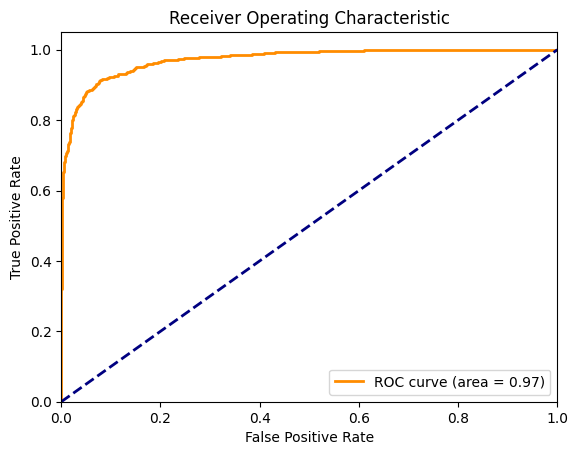

In [ ]:
# 11. Visualizar la Curva ROC
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()